## Predicting Spill Contributing Factors: A Decision Tree Approach

### Introduction:
We will examine a dataset in this notebook that includes records of oil and other hazardous chemicals spills. Spills that potentially contaminate the state's lands or waters are required by state law and regulations to be reported by the spiller (and, in certain situations, by anyone who has knowledge of the spill).

My objective is to use the different attributes provided in the dataset provided on the data.gov site against the link:'https://catalog.data.gov/dataset/spill-incidents', to determine the contributing component of these spills. The main cause or explanation for each spill is represented by the target variable, "Contributing Factor."

I will use a Decision Tree Classifier, a preferred machine learning model noted for its interpretability and capacity to handle categorical data, to accomplish this. Additionally, in order to optimize the performance of our model, we will use Grid Search to determine the ideal hyperparameters.

First, I will import the dataset and explore it, doing feature engineering and data cleaning along the way. After that, I will train our Decision Tree model and preprocess the data. Lastly, we'll assess the model's effectiveness and analyse the findings.

In [1]:
# Import necessary modules
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder, FunctionTransformer
from sklearn.tree import DecisionTreeClassifier

In [2]:
# Set a random seed for reproducibility
np.random.seed(1)

### Load, Explore and Clean Data  

In [3]:
#Load the dataset and check first 5 rows of the dataset
df = pd.read_csv('/Users/sunilinus/Downloads/Spill_Incidents.csv')
df.head()

,Spill Number,Program Facility Name,Street 1,Street 2,Locality,County,ZIP Code,SWIS Code,DEC Region,Spill Date,Received Date,Contributing Factor,Waterbody,Source,Close Date,Material Name,Material Family,Quantity,Units,Recovered
0,107132,MH 864,RT 119/MILLWOOD RD,NaN,ELMSFORD,Westchester,NaN,6000,3,10/10/2001,10/10/2001,Unknown,NaN,Unknown,10/15/2001,unknown material,Other,10.0,Gallons,0.0
1,405586,BOWRY BAY,WATER POLL CONTROL,NaN,QUEENS,Queens,NaN,4101,2,08/21/2004,08/21/2004,Other,EAST RIVER,Unknown,09/17/2004,raw sewage,Other,0.0,Pounds,0.0
2,405586,BOWRY BAY,WATER POLL CONTROL,NaN,QUEENS,Queens,NaN,4101,2,08/21/2004,08/21/2004,Other,EAST RIVER,Unknown,09/17/2004,raw sewage,Other,0.0,NaN,0.0
3,204667,POLE 16091,GRACE AVE/BURKE AVE,NaN,BRONX,Bronx,NaN,301,2,08/02/2002,08/02/2002,Equipment Failure,NaN,Commercial/Industrial,10/28/2002,transformer oil,Petroleum,1.0,Gallons,0.0
4,210559,POLE ON,FERDALE LOMIS RD / RT 52,NaN,LIBERTY,Sullivan,NaN,5336,3,01/20/2003,01/20/2003,Traffic Accident,NaN,Commercial/Industrial,01/22/2003,transformer oil,Petroleum,6.0,Gallons,6.0


In [4]:
#Check how many rows and columns in the dataset
df.shape

(545060, 20)

### Dropping unimportant features:
A number of columns that are not useful in predicting the factors that contribute to spills were dropped. Some of these are unique identifiers (e.g., "Spill Number"), location specifics (e.g., "Street 1," "Street 2," "Locality," "County," "ZIP Code," "SWIS Code," "DEC Region," "Waterbody"), and non-essential features (e.g., "Program Facility Name," "Material Name," "Units"). The dataset is made simpler and more focused on key variables by removing these columns.


In [5]:
columns_to_drop = ['Spill Number', 'Program Facility Name', 'Material Name', 'Street 1', 'Street 2', 'Locality', 'Units', 'County', 'ZIP Code', 'SWIS Code', 'DEC Region', 'Waterbody']
df = df.drop(columns=columns_to_drop)

In [6]:
# Check for missing values
df.isnull().sum()

Spill Date               151
Received Date            483
Contributing Factor        0
Source                     0
Close Date             10521
Material Family            0
Quantity                   0
Recovered                  0
dtype: int64

In [7]:
#Check the variable types
df.dtypes

Spill Date              object
Received Date           object
Contributing Factor     object
Source                  object
Close Date              object
Material Family         object
Quantity               float64
Recovered              float64
dtype: object

In [8]:
df['Source'].unique()

array(['Unknown', 'Commercial/Industrial', 'Private Dwelling',
       'Commercial Vehicle', 'Tank Truck',
       'Institutional, Educational, Gov., Other', 'Railroad Car',
       'Gasoline Station or other PBS Facility',
       'Major Facility (MOSF) > 400,000 gal', 'Passenger Vehicle',
       'Transformer', 'Vessel', 'Non Major Facility > 1,100 gal',
       'Missing Code in Old Data - Must be fixed', 'Airport/Aircraft',
       'Chemical Bulk Storage Facility'], dtype=object)

In [9]:
unique_count = df['Source'].nunique()
print(unique_count)

16


In [10]:
df['Material Family'].unique()

array(['Other', 'Petroleum', 'Hazardous Material', 'Oxygenates'],
      dtype=object)

In [11]:
unique_count1 = df['Material Family'].nunique()
print(unique_count)

16


In [12]:
#Check misspelled words for each categorical variable
df['Contributing Factor'].unique()

array(['Unknown', 'Other', 'Equipment Failure', 'Traffic Accident',
       'Abandoned Drums', 'Tank Failure', 'Human Error', 'Deliberate',
       'Tank Overfill', 'Tank Test Failure', 'Housekeeping', 'Storm',
       'Vandalism', 'Missing Code in Old Data - Must be fixed'],
      dtype=object)

Considering 'Missing Code in Old Data - Must be fixed' and 'unknown' as missing values, as they indicate a lack of specific information. Given the goal of predicting the contributing factor based on the available data, handling missing values in a way that minimizes information loss is crucial. Hence, imputing missing values based on the most frequent value in the column ('mode') since the contributing factor is a categorical variable.

In [13]:
# Replace 'Missing Code in Old Data - Must be fixed' and 'unknown' with NaN
df['Contributing Factor'] = df['Contributing Factor'].replace(['Missing Code in Old Data - Must be fixed', 'Unknown'], np.nan)

# Replace missing values with the mode (most frequent value) of the column
df['Contributing Factor'] = df['Contributing Factor'].fillna(df['Contributing Factor'].mode()[0])

df['Contributing Factor'].unique()

array(['Equipment Failure', 'Other', 'Traffic Accident',
       'Abandoned Drums', 'Tank Failure', 'Human Error', 'Deliberate',
       'Tank Overfill', 'Tank Test Failure', 'Housekeeping', 'Storm',
       'Vandalism'], dtype=object)

In [14]:
# Convert date columns to datetime format
df['Spill Date'] = pd.to_datetime(df['Spill Date'])
df['Received Date'] = pd.to_datetime(df['Received Date'])
df['Close Date'] = pd.to_datetime(df['Close Date'])

Using techniques to fill missing values in date columns may not be the best approach, especially if the dates are unique and have specific meanings. Hence, dropping the columns with missing date values since they are considerably less rows given the size of the whole data.

In [15]:
# Drop rows with missing date values
df = df.dropna(subset=['Spill Date', 'Received Date', 'Close Date'])

Conducting feature engineering and creating a new column indicating the number of days it took to close a spill from the day it occurred. Another key feature for predicting the contributing factor of a spill could be the duration of the spill before it was reported. This could indicate the severity or impact of the spill, which could be related to the contributing factor. Also creating a binary column which gives the information of the spills with the quantity more than the average spill quanitity, helping to categorize if it is a major spill or not.

In [16]:
def new_col(df):
    # Create a copy so that we don't overwrite the existing dataframe
    df1 = df.copy()
    
    # Calculate the number of days to close a spill
    df1['Days to Close'] = (df1['Close Date'] - df1['Spill Date']).dt.days
    
    # Calculate the duration of the spill before it was reported
    df1['Duration Before Reported'] = (df1['Received Date'] - df1['Spill Date']).dt.days
    
    # Calculate a new binary column as a feature engineering step
    df1['High Quantity'] = np.where(df1['Quantity'] > df1['Quantity'].mean(), 1, 0)
        
    # Concatenate the original dataframe with the new columns dataframe
    df = pd.concat([df, df1[['Days to Close', 'Duration Before Reported', 'High Quantity']]], axis=1)
    
    return df

df = new_col(df)

Dropping the timestamp columns since we have conducted the feature engineering and obtained the columns with the information we can possibly get from the provided dates.

In [17]:
df = df.drop(columns=['Spill Date', 'Received Date', 'Close Date'])

In [18]:
#Check each columns 
df.columns

Index(['Contributing Factor', 'Source', 'Material Family', 'Quantity',
       'Recovered', 'Days to Close', 'Duration Before Reported',
       'High Quantity'],
      dtype='object')

In [19]:
# Check for missing values
df.isnull().sum()

Contributing Factor         0
Source                      0
Material Family             0
Quantity                    0
Recovered                   0
Days to Close               0
Duration Before Reported    0
High Quantity               0
dtype: int64

In [20]:
#Check the variable types
df.dtypes

Contributing Factor          object
Source                       object
Material Family              object
Quantity                    float64
Recovered                   float64
Days to Close                 int64
Duration Before Reported      int64
High Quantity                 int64
dtype: object

In [21]:
# Count the occurrences of each contributing factor
factor_counts = df['Contributing Factor'].value_counts()

# Calculate the imbalance ratio
imbalance_ratio = factor_counts.max() / factor_counts.min()

print("Imbalance Ratio:", imbalance_ratio)

Imbalance Ratio: 161.24490919097414


In [22]:
# Count the occurrences of each contributing factor
factor_counts = df['Contributing Factor'].value_counts()

# Identify the majority and minority classes
majority_class = factor_counts.idxmax()
minority_class = factor_counts.idxmin()

# Get the count of each class
majority_count = factor_counts.max()
minority_count = factor_counts.min()

print("Majority Class:", majority_class)
print("Count of Majority Class:", majority_count)
print("Minority Class:", minority_class)
print("Count of Minority Class:", minority_count)

Majority Class: Equipment Failure
Count of Majority Class: 292982
Minority Class: Vandalism
Count of Minority Class: 1817


The model's predictions must be accurate and reliable because the dataset contains records of oil and hazardous chemical spills. This is especially important for the minority class, which represents rare but significant contributing elements. Addressing the imbalance in the data may cause noise or bias to enter the model, resulting in incorrect predictions and possibly missing significant contributing components. By keeping the imbalance in the dataset, the model may concentrate on understanding the underlying patterns and traits of the minority class without being impacted by oversampling or undersampling strategies.

### Split the Data into Train and Test

In [23]:
# Split the data into training and test sets
train_df, test_df = train_test_split(df, test_size=0.3)

In [24]:
# Separate the target variable
train_y = train_df['Contributing Factor']
test_y = test_df['Contributing Factor']

In [25]:
train_inputs = train_df.drop(['Contributing Factor'], axis=1)
test_inputs = test_df.drop(['Contributing Factor'], axis=1)

### Identifying Numerical and Categorical Columns

In [26]:
# Define numeric and categorical columns for existing features
numeric_columns = ['Quantity', 'Recovered']
categorical_columns = ['Source', 'Material Family']

### Pipelines

In [27]:
# Transformer for feature engineering (creates new columns)
my_new_column = Pipeline(steps=[('my_new_column', FunctionTransformer(new_col)),
                               ('scaler', StandardScaler())])

In [28]:
numeric_transformer = Pipeline(steps=[
                ('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler())])

In [29]:
categorical_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='constant', fill_value='unknown')),
    ('onehot', OneHotEncoder(handle_unknown='ignore'))])

In [30]:
# Create the preprocessor, excluding feat_eng_columns
preprocessor = ColumnTransformer([
        ('num', numeric_transformer, numeric_columns),
        ('cat', categorical_transformer, categorical_columns)],
        remainder='passthrough')

### Transform: fit_transform() for TRAIN

In [31]:
X_train = preprocessor.fit_transform(train_inputs)

X_train

<373746x25 sparse matrix of type '<class 'numpy.float64'>'
	with 1881632 stored elements in Compressed Sparse Row format>

In [32]:
X_train.shape

(373746, 25)

### Tranform: transform() for TEST

In [33]:
X_test = preprocessor.transform(test_inputs)

X_test

<160178x25 sparse matrix of type '<class 'numpy.float64'>'
	with 806073 stored elements in Compressed Sparse Row format>

In [34]:
X_test.shape

(160178, 25)

### Baseline

In [35]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")

dummy_clf.fit(X_train, train_y)

DummyClassifier(strategy='most_frequent')

In [36]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [37]:
#Baseline Train Accuracy
dummy_train_pred = dummy_clf.predict(X_train)

print("Accuracy:", accuracy_score(train_y, dummy_train_pred))
print("Precision:", precision_score(train_y, dummy_train_pred, average='weighted'))
print("Recall:", recall_score(train_y, dummy_train_pred, average='weighted'))
print("F1 Score:", f1_score(train_y, dummy_train_pred, average='weighted'))

Accuracy: 0.5484981779069208


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.3008502511672121
Recall: 0.5484981779069208
F1 Score: 0.3885703650925394


In [38]:
#Baseline Test Accuracy
dummy_test_pred = dummy_clf.predict(X_test)

print("Accuracy:", accuracy_score(test_y, dummy_test_pred))
print("Precision:", precision_score(test_y, dummy_test_pred, average='weighted'))
print("Recall:", recall_score(test_y, dummy_test_pred, average='weighted'))
print("F1 Score:", f1_score(test_y, dummy_test_pred, average='weighted'))

Accuracy: 0.5492826730262583


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.3017114548868714
Recall: 0.5492826730262583
F1 Score: 0.38948535362824366


### Decision Tree

In [39]:
from sklearn.model_selection import GridSearchCV
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

In [40]:
# Define the parameter grid
param_grid = {
    'max_depth': [None, 5, 10, 15],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

In [41]:
# Instantiate the DecisionTreeClassifier
tree_clf = DecisionTreeClassifier(random_state=42)
tree_clf.fit(X_train, train_y)

DecisionTreeClassifier(random_state=42)

### Accuracy

In [42]:
from sklearn.metrics import accuracy_score

In [43]:
#Train accuracy:
train_y_pred = tree_clf.predict(X_train)

print("Accuracy:", accuracy_score(train_y, train_y_pred))
print("Precision:", precision_score(train_y, train_y_pred, average='weighted'))
print("Recall:", recall_score(train_y, train_y_pred, average='weighted'))
print("F1 Score:", f1_score(train_y, train_y_pred, average='weighted'))

Accuracy: 0.6849518121933078
Precision: 0.7279233810490732
Recall: 0.6849518121933078
F1 Score: 0.6440810535180392


In [44]:
#Test accuracy:
test_y_pred = tree_clf.predict(X_test)

print("Accuracy:", accuracy_score(test_y, test_y_pred))
print("Precision:", precision_score(test_y, test_y_pred, average='weighted'))
print("Recall:", recall_score(test_y, test_y_pred, average='weighted'))
print("F1 Score:", f1_score(test_y, test_y_pred, average='weighted'))

Accuracy: 0.5181360736180999
Precision: 0.42973356255570844
Recall: 0.5181360736180999
F1 Score: 0.4492532115836735


### Classification Matrix

In [45]:
from sklearn.metrics import confusion_matrix

#Test confusion matrix
confusion_matrix(test_y, test_y_pred)

array([[  312,   127,  1899,    27,    48,    99,     4,    30,     7,
           21,    14,     1],
       [  135,   671,  4779,   166,   164,   327,    16,    87,    33,
           76,   225,     7],
       [  786,  1393, 74853,   841,  1807,  2931,   330,  1103,   494,
         1294,  2031,   120],
       [   52,   239,  3427,   502,   107,   294,    11,    92,    23,
          125,    54,     3],
       [   75,   205,  8368,   131,   617,   410,    25,   133,   136,
          106,   373,    22],
       [  115,   454, 12186,   255,   418,  1691,    39,   301,   142,
          414,   406,    24],
       [    3,    29,  1837,     5,    25,    38,   600,    13,     4,
           11,    31,     1],
       [   47,   123,  4898,   120,   158,   320,    27,   330,    48,
          235,    76,    12],
       [   17,    58,  2491,    39,   156,   150,     7,    64,    81,
           69,    79,    10],
       [   30,   123,  6621,   113,    94,   448,    22,   237,    39,
          815,     9

### Plot the Tree

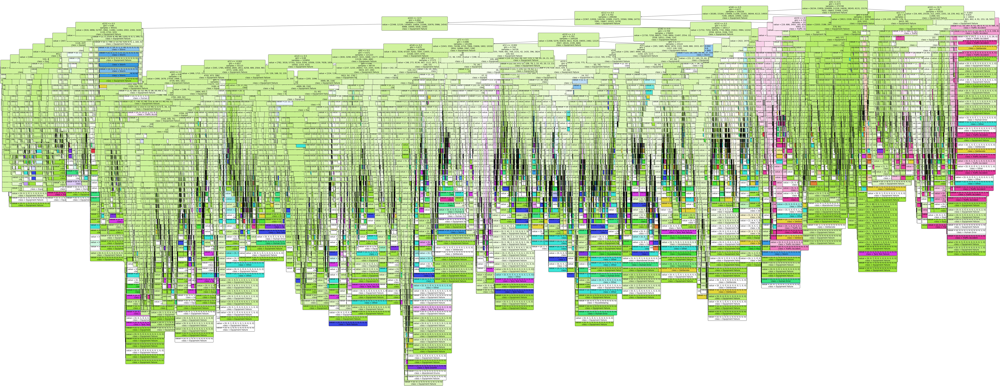

In [46]:
from sklearn.tree import plot_tree
import matplotlib.pyplot as plt

plt.figure(figsize=(125,50))

tree = plot_tree(tree_clf, 
              #feature_names=train_inputs.columns.values, # our feature names are stripped from the data set
              class_names=np.unique(train_y), 
              filled=True, 
              rounded=True, 
              fontsize=14)

### Feature Importance

In [47]:
np.round(tree_clf.feature_importances_,3)

array([0.115, 0.067, 0.001, 0.   , 0.028, 0.004, 0.009, 0.007, 0.002,
       0.   , 0.002, 0.024, 0.006, 0.001, 0.007, 0.011, 0.029, 0.003,
       0.006, 0.012, 0.   , 0.008, 0.543, 0.114, 0.   ])

### More Regularization

In [48]:
tree_clf2 = DecisionTreeClassifier(min_samples_leaf = 10, max_depth=5)

tree_clf2.fit(X_train, train_y)

DecisionTreeClassifier(max_depth=5, min_samples_leaf=10)

In [49]:
#Train accuracy:
train_y_pred = tree_clf2.predict(X_train)

print("Accuracy:", accuracy_score(train_y, train_y_pred))
print("Precision:", precision_score(train_y, train_y_pred, average='weighted'))
print("Recall:", recall_score(train_y, train_y_pred, average='weighted'))
print("F1 Score:", f1_score(train_y, train_y_pred, average='weighted'))

Accuracy: 0.5533972269937337


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.3417010561180581
Recall: 0.5533972269937337
F1 Score: 0.40868373759070675


In [51]:
#Test accuracy:
test_y_pred = tree_clf2.predict(X_test)

print("Accuracy:", accuracy_score(test_y, test_y_pred))
print("Precision:", precision_score(test_y, test_y_pred, average='weighted'))
print("Recall:", recall_score(test_y, test_y_pred, average='weighted'))
print("F1 Score:", f1_score(test_y, test_y_pred, average='weighted'))

Accuracy: 0.5546829152567768


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.3420716654510867
Recall: 0.5546829152567768
F1 Score: 0.4101251476834665


In [52]:
#Test confusion matrix
confusion_matrix(test_y, test_y_pred)

array([[  148,     0,  2431,     0,     0,     0,     0,     0,     0,
            0,    10,     0],
       [   36,     0,  6385,     0,     0,     0,     0,     0,     0,
            0,   265,     0],
       [   84,     0, 86663,     0,     0,     0,     0,     0,     0,
            0,  1236,     0],
       [    1,     0,  4864,     0,     0,     0,     0,     0,     0,
            0,    64,     0],
       [    3,     0, 10324,     0,     0,     0,     0,     0,     0,
            0,   274,     0],
       [   24,     0, 16090,     0,     0,     0,     0,     0,     0,
            0,   331,     0],
       [    0,     0,  2591,     0,     0,     0,     0,     0,     0,
            0,     6,     0],
       [    0,     0,  6347,     0,     0,     0,     0,     0,     0,
            0,    47,     0],
       [    3,     0,  3192,     0,     0,     0,     0,     0,     0,
            0,    26,     0],
       [    0,     0,  8553,     0,     0,     0,     0,     0,     0,
            0,     5

### Prediction probabilities

In [53]:
#Select a random observation

random = X_test[50:51]
random

<1x25 sparse matrix of type '<class 'numpy.float64'>'
	with 5 stored elements in Compressed Sparse Row format>

In [54]:
# Observe the input variables of the observation

tree_clf2.predict_proba(random)

array([[0.00978396, 0.04100215, 0.50317837, 0.04377333, 0.05601176,
        0.12157561, 0.01444407, 0.06923425, 0.02012216, 0.10355729,
        0.01327904, 0.004038  ]])

In [55]:
# Round the probability values

np.round(tree_clf2.predict_proba(random),2)

array([[0.01, 0.04, 0.5 , 0.04, 0.06, 0.12, 0.01, 0.07, 0.02, 0.1 , 0.01,
        0.  ]])

### Change to entropy

In [56]:
tree_clf3 = DecisionTreeClassifier(max_depth=5, criterion='entropy')
tree_clf3.fit(X_train, train_y)

DecisionTreeClassifier(criterion='entropy', max_depth=5)

In [57]:
#Train accuracy:
train_y_pred = tree_clf3.predict(X_train)

print("Accuracy:", accuracy_score(train_y, train_y_pred))
print("Precision:", precision_score(train_y, train_y_pred, average='weighted'))
print("Recall:", recall_score(train_y, train_y_pred, average='weighted'))
print("F1 Score:", f1_score(train_y, train_y_pred, average='weighted'))

Accuracy: 0.5529798312222739


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.340179268271831
Recall: 0.5529798312222739
F1 Score: 0.40959033065865497


In [59]:
#Test accuracy:
test_y_pred = tree_clf3.predict(X_test)

print("Accuracy:", accuracy_score(test_y, test_y_pred))
print("Precision:", precision_score(test_y, test_y_pred, average='weighted'))
print("Recall:", recall_score(test_y, test_y_pred, average='weighted'))
print("F1 Score:", f1_score(test_y, test_y_pred, average='weighted'))

Accuracy: 0.5544893805641224


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.34134901914094107
Recall: 0.5544893805641224
F1 Score: 0.4113680800130572


In [60]:
#Test confusion matrix
confusion_matrix(test_y, test_y_pred)

array([[  227,     0,  2348,     0,     0,     0,     0,     0,     0,
            0,    14,     0],
       [   50,     0,  6327,     0,     0,     0,     0,     0,     0,
            0,   309,     0],
       [  129,     0, 86412,     0,     0,     0,     0,     0,     0,
            0,  1442,     0],
       [    2,     0,  4845,     0,     0,     0,     0,     0,     0,
            0,    82,     0],
       [    8,     0, 10289,     0,     0,     0,     0,     0,     0,
            0,   304,     0],
       [   32,     0, 16026,     0,     0,     0,     0,     0,     0,
            0,   387,     0],
       [    0,     0,  2591,     0,     0,     0,     0,     0,     0,
            0,     6,     0],
       [    0,     0,  6340,     0,     0,     0,     0,     0,     0,
            0,    54,     0],
       [    4,     0,  3188,     0,     0,     0,     0,     0,     0,
            0,    29,     0],
       [    0,     0,  8553,     0,     0,     0,     0,     0,     0,
            0,     5

### Randomized Grid Search

In [61]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import randint

param_grid = {'max_depth': randint(low=5, high=20), 
              'min_samples_leaf': randint(low=5, high=20)}

tree_gs = RandomizedSearchCV(DecisionTreeClassifier(), param_grid, 
                             n_iter=15, cv=5, verbose=1,
                             scoring='accuracy',
                             return_train_score=True)

tree_gs.fit(X_train, train_y)

Fitting 5 folds for each of 15 candidates, totalling 75 fits


RandomizedSearchCV(cv=5, estimator=DecisionTreeClassifier(), n_iter=15,
                   param_distributions={'max_depth': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x298f2b910>,
                                        'min_samples_leaf': <scipy.stats._distn_infrastructure.rv_discrete_frozen object at 0x284bb8f10>},
                   return_train_score=True, scoring='accuracy', verbose=1)

In [62]:
cvres = tree_gs.cv_results_

for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(mean_score, params)

0.5561370565510412 {'max_depth': 12, 'min_samples_leaf': 19}
0.5559149808247902 {'max_depth': 17, 'min_samples_leaf': 19}
0.5559791958022637 {'max_depth': 15, 'min_samples_leaf': 18}
0.5557624700295763 {'max_depth': 14, 'min_samples_leaf': 16}
0.5548126276250002 {'max_depth': 16, 'min_samples_leaf': 11}
0.5540875354581314 {'max_depth': 18, 'min_samples_leaf': 12}
0.5562547842722341 {'max_depth': 10, 'min_samples_leaf': 16}
0.5559096296184273 {'max_depth': 17, 'min_samples_leaf': 19}
0.5522092561187271 {'max_depth': 19, 'min_samples_leaf': 8}
0.5538574343004152 {'max_depth': 17, 'min_samples_leaf': 8}
0.5538172992325576 {'max_depth': 16, 'min_samples_leaf': 6}
0.5560648156051885 {'max_depth': 10, 'min_samples_leaf': 8}
0.556027356229998 {'max_depth': 14, 'min_samples_leaf': 18}
0.5532634458482704 {'max_depth': 6, 'min_samples_leaf': 11}
0.5552219967551607 {'max_depth': 8, 'min_samples_leaf': 9}


In [63]:
#Find the best parameter set
tree_gs.best_params_

{'max_depth': 10, 'min_samples_leaf': 16}

In [64]:
tree_gs.best_estimator_

DecisionTreeClassifier(max_depth=10, min_samples_leaf=16)

In [65]:
#Train accuracy:
train_y_pred = tree_gs.best_estimator_.predict(X_train)

print("Accuracy:", accuracy_score(train_y, train_y_pred))
print("Precision:", precision_score(train_y, train_y_pred, average='weighted'))
print("Recall:", recall_score(train_y, train_y_pred, average='weighted'))
print("F1 Score:", f1_score(train_y, train_y_pred, average='weighted'))

Accuracy: 0.5582828980109487


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.46245929749658127
Recall: 0.5582828980109487
F1 Score: 0.424801401364835


In [66]:
#Test accuracy:
test_y_pred = tree_gs.best_estimator_.predict(X_test)

print("Accuracy:", accuracy_score(test_y, test_y_pred))
print("Precision:", precision_score(test_y, test_y_pred, average='weighted'))
print("Recall:", recall_score(test_y, test_y_pred, average='weighted'))
print("F1 Score:", f1_score(test_y, test_y_pred, average='weighted'))

Accuracy: 0.5571988662612843


/Users/sunilinus/anaconda3/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1471: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Precision: 0.4495988778342529
Recall: 0.5571988662612843
F1 Score: 0.42388403665204205


In [67]:
#Test confusion matrix
confusion_matrix(test_y, test_y_pred)

array([[  203,    29,  2344,     0,     0,     1,     0,     0,     0,
            0,    12,     0],
       [   42,   164,  6145,     0,     6,    33,     1,     0,     0,
            0,   295,     0],
       [  100,   154, 85742,    30,   125,   226,    58,     0,     0,
            0,  1548,     0],
       [    1,    66,  4671,    28,    16,    77,     0,     0,     0,
            0,    70,     0],
       [    6,    34, 10041,    31,   131,    21,     1,     0,     0,
            0,   336,     0],
       [   25,    87, 15573,     6,    34,   318,     2,     0,     0,
            0,   400,     0],
       [    1,    10,  2292,     1,     1,     4,   282,     0,     0,
            0,     6,     0],
       [    1,     2,  6333,     0,     2,     1,     0,     0,     0,
            0,    55,     0],
       [    2,     2,  3148,     1,    25,     1,     0,     0,     0,
            0,    42,     0],
       [    0,    16,  8529,     0,     0,     8,     0,     0,     0,
            0,     5

### Analysis and Discussion:

#### Baseline Model (Dummy Classifier):

- About 54.9% of the training and test sets were accurately predicted by the baseline model, which merely predicts the most common class. Accordingly, the model would roughly 55% of the time accurately predict the most common class in the absence of any learning.
- On the other hand, the precision, recall, and F1-score of the baseline model are very poor. The model struggles to correctly identify positive cases (spill contributing elements) when it predicts them, as indicated by the very low precision.

#### Decision Tree Model:
- On the test set, the decision tree model's accuracy was about 55.7%, which is marginally higher than the baseline. This implies that rather than only estimating the most common class, the decision tree is now able to make somewhat more accurate predictions because it has identified certain patterns in the data.
- The decision tree model also outperforms the baseline in terms of precision, recall, and F1-score. The results show an improvement in performance over the baseline, however it is still not very high.
- Additionally, the decision tree model that performed similar to the baseline had greater regularization (max_depth=5, min_samples_leaf=10). This shows that improved performance is not always a result of a more complex model, highlighting the importance of regularization and model tuning.

#### Comparision and Implications:
- When compared to the baseline, the decision tree model's accuracy and performance indicators show a slight improvement. This suggests that rather than only estimating the most common class, the decision tree is now able to generate more accurate predictions since it has identified certain patterns in the data.
- However, the decision tree model's overall performance remains comparatively low. This implies that there is potential for improvement in the model and that forecasting the contributing elements to spills is a difficult undertaking.
- The model's comparatively low performance may have significant effects because it is essential to accurately predict the components that contribute to spills in order to avoid and mitigate environmental damage.

#### Conclusion:
In conclusion, there is still space for development in the decision tree model's ability to forecast spill contributing elements, even though it exhibits a slight advantage over the baseline. It might also be advantageous to take into account alternative machine learning techniques, like Random Forest or Gradient Boosting. These algorithms may work better than a single decision tree because they are well-known for their performance in classification tasks.